In [1]:
# Magic Words
from __future__ import annotations
import matplotlib as mpl
import matplotlib.pyplot as plt  # noqa: F401
import seaborn as sns
import numpy as np  # noqa: F401
import pandas as pd
from collections import defaultdict, Counter  # noqa: F401
from typing import Union, Optional
from IPython.display import display, Markdown

%matplotlib inline
%load_ext wurlitzer
mpl.rcParams["font.family"] = "Noto Sans JP"
sns.set(font=["Noto Sans JP"], font_scale=1.5)
pd.set_option("display.date_yearfirst", True)
pd.set_option("display.float_format", "{:.4f}".format)


# The function displays Table or Text even inside function
def show_it(
    data: Union[str, pd.DataFrame],
    demical: Optional[int] = 4,
) -> None:
    if isinstance(data, pd.DataFrame):
        display(
            Markdown(data.to_markdown(floatfmt=f".{demical}f", intfmt=","))
        )
    else:
        display(Markdown(data.strip()))
    return

In [2]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix


def classification_result(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    labels: List[str],
) -> None:
    show_it("#### Classification Metrics")
    show_it(
        pd.DataFrame(
            classification_report(
                y_true,
                y_pred,
                target_names=labels,
                output_dict=True,
                zero_division=0,
            )
        ).T
    )
    show_it("#### Confusion Matrix")
    mat: pd.DataFrame = pd.DataFrame(confusion_matrix(y_true, y_pred))
    mat = pd.concat(
        [mat, pd.DataFrame(mat.sum(axis="columns"))], axis="columns"
    )
    mat = pd.concat([mat, pd.DataFrame(mat.sum(axis="index")).T], axis="index")
    mat.columns = [f"{x}実際" for x in labels] + ["予測合計"]
    mat.index = [f"{x}予測" for x in labels] + ["実際合計"]
    show_it(mat)
    return

# Explainable AI

* 「[説明可能なAI](https://ja.wikipedia.org/wiki/%E8%AA%AC%E6%98%8E%E5%8F%AF%E8%83%BD%E3%81%AAAI)（XAI）」
    * AI が導き出した答えに対して、人間が納得できる根拠を示すための技術である。特定の技術やツールを指し示す言葉ではなく、「AIを理解する」という目的ために研究・提案されている技術の総称である。
* 説明しない Data Scientist はモグリ

### Notation

* 今回は Explainability のみに注目する
    * 正しい学習方法を行うとは限らない
        * Train Test Split, Cross Validation などは全て省略
    * 予測精度にはこだわらない
        * 精度が悪くても、とにかく Explain

## Explainable Models

* 線形モデル
    * 人間が理解できる限界は、１次方程式まで
        * Causal Analysis（因果解析）は１次方程式しか使わない
    * Regression: Linear Regression
    * Classification: Logistic Regression
* 木系モデル
    * 木がどの特徴量を使って分岐したかで特徴量の重要度が得られる
        * Feature Importance
    * Random Forest, Gradient Boosting

In [3]:
# Toy Dataset
from typing import List, Dict
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler


iris: Dict = load_iris()
iris_data: pd.DataFrame = pd.DataFrame(
    iris["data"], columns=iris["feature_names"]
)
iris_norm = StandardScaler().fit_transform(iris_data)
iris_name: List[str] = [iris["target_names"][x] for x in iris["target"]]

In [4]:
iris_data.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1000,3.5000,1.4000,0.2000
1,4.9000,3.0000,1.4000,0.2000
2,4.7000,3.2000,1.3000,0.2000
3,4.6000,3.1000,1.5000,0.2000
4,5.0000,3.6000,1.4000,0.2000


In [5]:
from IPython.display import Image


Image(url="https://miro.medium.com/v2/1*Hh53mOF4Xy4eORjLilKOwA.png")

In [6]:
Counter(iris_name)

Counter({'setosa': 50, 'versicolor': 50, 'virginica': 50})

### Logistic Regression

* 各特徴量の係数（偏回帰係数: Partial Regression Coefficient）（と切片 (Intercept)）で、予測結果に対してどの特徴量が効くかが分かる
    * 正負がある

In [7]:
from sklearn.linear_model import LogisticRegression


iris_lr: LogisticRegression = LogisticRegression(
    max_iter=1000, random_state=12
).fit(iris_norm, iris["target"])

In [8]:
classification_result(
    y_true=iris["target"],
    y_pred=iris_lr.predict(iris_norm),
    labels=iris["target_names"],
)

#### Classification Metrics

|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| setosa       |      1.0000 |   1.0000 |     1.0000 |   50.0000 |
| versicolor   |      0.9792 |   0.9400 |     0.9592 |   50.0000 |
| virginica    |      0.9423 |   0.9800 |     0.9608 |   50.0000 |
| accuracy     |      0.9733 |   0.9733 |     0.9733 |    0.9733 |
| macro avg    |      0.9738 |   0.9733 |     0.9733 |  150.0000 |
| weighted avg |      0.9738 |   0.9733 |     0.9733 |  150.0000 |

#### Confusion Matrix

|                |   setosa実際 |   versicolor実際 |   virginica実際 |   予測合計 |
|:---------------|-------------:|-----------------:|----------------:|-----------:|
| setosa予測     |      50.0000 |           0.0000 |          0.0000 |    50.0000 |
| versicolor予測 |       0.0000 |          47.0000 |          3.0000 |    50.0000 |
| virginica予測  |       0.0000 |           1.0000 |         49.0000 |    50.0000 |
| 実際合計       |      50.0000 |          48.0000 |         52.0000 |   150.0000 |

#### Coefficients and Intercepts

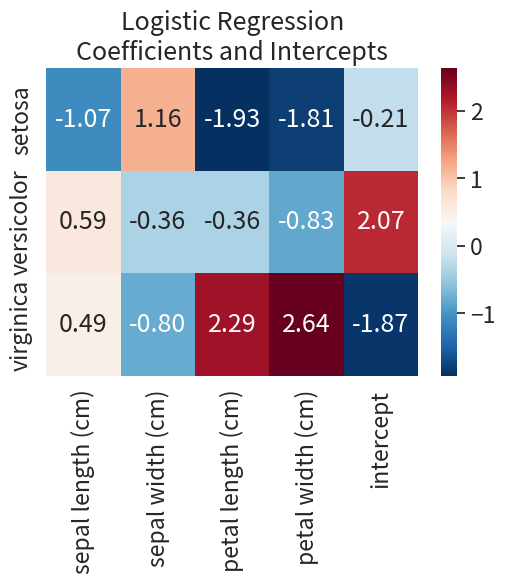

In [9]:
show_it("#### Coefficients and Intercepts")
fig, ax = plt.subplots(figsize=(6, 4))
sns.heatmap(
    pd.DataFrame(
        pd.concat(
            [
                pd.DataFrame(
                    iris_lr.coef_,
                    index=iris["target_names"],
                    columns=iris["feature_names"],
                ),
                pd.DataFrame(
                    iris_lr.intercept_.reshape(-1, 1),
                    index=iris["target_names"],
                    columns=["intercept"],
                ),
            ],
            axis="columns",
        )
    ),
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    ax=ax,
)
plt.title("Logistic Regression\nCoefficients and Intercepts")
plt.show()
plt.clf()
plt.close()

### Random Forest

* Feature Importance は「どのくらい重要か」を示す
    * プラスに働くのか、マイナスに働くのかは分からない

In [10]:
from sklearn.ensemble import RandomForestClassifier


iris_rf: RandomForestClassifier = RandomForestClassifier(
    n_estimators=10, max_features="sqrt", max_depth=5, random_state=12
).fit(iris_data, iris["target"])

In [11]:
classification_result(
    y_true=iris["target"],
    y_pred=iris_rf.predict(iris_data),
    labels=iris["target_names"],
)

#### Classification Metrics

|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| setosa       |      1.0000 |   1.0000 |     1.0000 |   50.0000 |
| versicolor   |      1.0000 |   0.9800 |     0.9899 |   50.0000 |
| virginica    |      0.9804 |   1.0000 |     0.9901 |   50.0000 |
| accuracy     |      0.9933 |   0.9933 |     0.9933 |    0.9933 |
| macro avg    |      0.9935 |   0.9933 |     0.9933 |  150.0000 |
| weighted avg |      0.9935 |   0.9933 |     0.9933 |  150.0000 |

#### Confusion Matrix

|                |   setosa実際 |   versicolor実際 |   virginica実際 |   予測合計 |
|:---------------|-------------:|-----------------:|----------------:|-----------:|
| setosa予測     |      50.0000 |           0.0000 |          0.0000 |    50.0000 |
| versicolor予測 |       0.0000 |          49.0000 |          1.0000 |    50.0000 |
| virginica予測  |       0.0000 |           0.0000 |         50.0000 |    50.0000 |
| 実際合計       |      50.0000 |          49.0000 |         51.0000 |   150.0000 |

#### Feature Importances

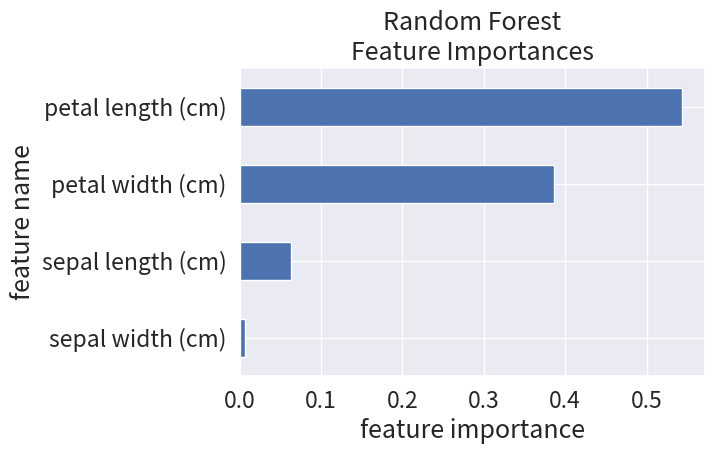

In [12]:
show_it("#### Feature Importances")
fig, ax = plt.subplots(figsize=(6, 4))
pd.DataFrame(
    {
        "feature name": iris["feature_names"],
        "feature importance": iris_rf.feature_importances_,
    }
).sort_values("feature importance", ascending=True).plot(
    kind="barh", x="feature name", y="feature importance", ax=ax
)
plt.legend().remove()
plt.title("Random Forest\nFeature Importances")
plt.xlabel("feature importance")
plt.show()
plt.clf()
plt.close()

## Visualization

* データの分布、データの予測状況を図示することも Explanation のひとつ
    * 各々の特徴量についてヒストグラムを描くことも EDA（Exploratory Data Analysis: 探索的データ解析）として重要
* 人間が正確に把握できるのは、（２次元）平面まで
* 高次元特徴量を持つデータの分布を平面で描写するには、t-SNE が良いと言われている
    * PCA, SVD は分散が大きい次元を抽出しているだけ
    * t-SNE は manifold learning（類似度の抽出）であるため、データの偏りを良く表現できる
* ただし、t-SNE には欠点もある
    * 計算量が非常に多く、重い
    * 類似度行列（ラプラス行列）の min-Cut と同義なので、学習・変換を行うだけで、予測が出来ない
        * 一度 `fit_transform()` したら、それでおしまい
        * 変換したいものを全部一度に `fit_transform()` する必要がある
* （Classification の場合は）境界や予測領域を図示すると、なお分かりやすい
    * すなわち t-SNE の場合は、全定義域の予測値や境界を予め計算し、`fit_transform()` に入れる必要がある

In [13]:
from sklearn.manifold import TSNE


iris_plane: pd.DataFrame = pd.DataFrame(
    TSNE(n_components=2, random_state=12).fit_transform(iris_norm),
    columns=["x1", "x2"],
)
iris_plane = iris_plane.assign(true=iris_name)
iris_plane = iris_plane.assign(
    pred=[iris["target_names"][x] for x in iris_lr.predict(iris_norm)]
)

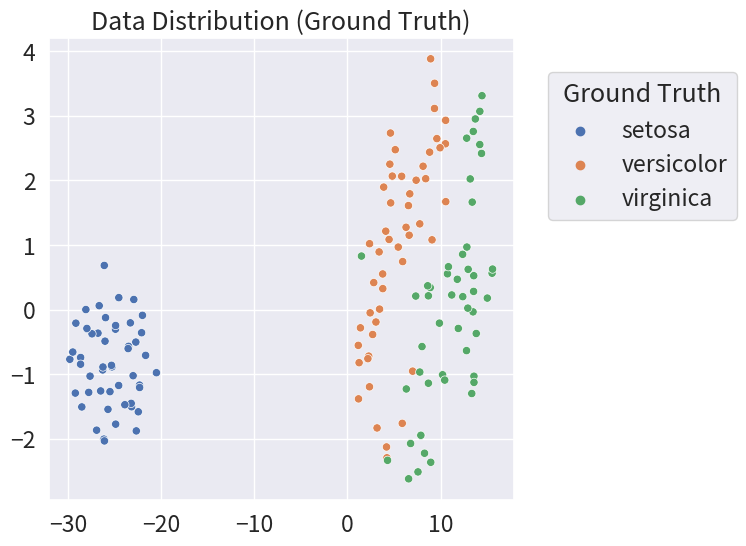

In [14]:
fig, ax = plt.subplots(figsize=(6, 6))
sns.scatterplot(data=iris_plane, x="x1", y="x2", hue="true", ax=ax)
plt.legend(title="Ground Truth", bbox_to_anchor=(1.05, 0.95), loc="upper left")
plt.title("Data Distribution (Ground Truth)")
plt.xlabel(None)
plt.ylabel(None)
plt.show()
plt.clf()
plt.close()

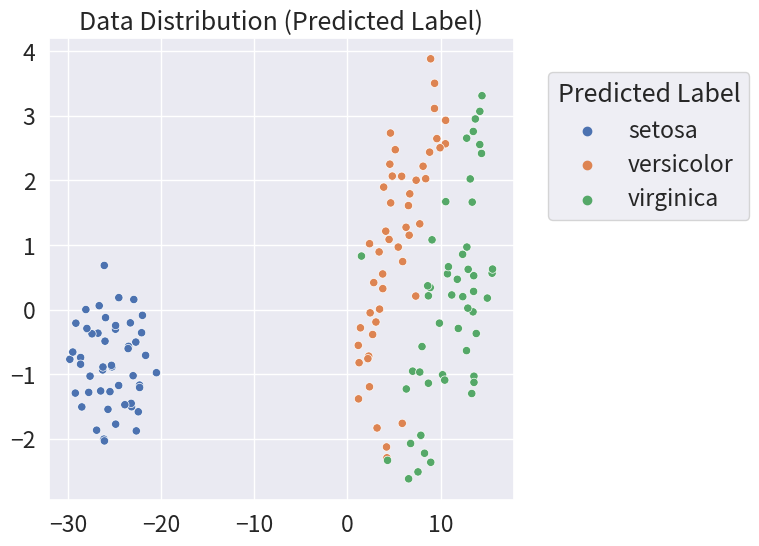

In [15]:
fig, ax = plt.subplots(figsize=(6, 6))
sns.scatterplot(data=iris_plane, x="x1", y="x2", hue="pred", ax=ax)
plt.legend(
    title="Predicted Label", bbox_to_anchor=(1.05, 0.95), loc="upper left"
)
plt.title("Data Distribution (Predicted Label)")
plt.xlabel(None)
plt.ylabel(None)
plt.show()
plt.clf()
plt.close()

## LIME

* 説明可能なモデルでなくても、予測結果から無理やり説明を捻り出す方法がある
* 有名なのは、以下の２つ
    * [LIME](https://github.com/marcotcr/lime) (Local Interpretable Model Explanations)
    * [SHAP](https://github.com/slundberg/shap) (SHapley Addtive exPlanations)
* SHAP は小難しいので、LIME を使う
* 要するに、難しい（非線形の）モデルで予測した結果を、無理やり線形モデルで予測し直して説明してしまおう、というもの
    * 局所的に多重線形回帰で予測して、偏回帰係数の揺れが大きい特徴量ほど「効いている」
    * ちゃんとした説明：https://hacarus.github.io/interpretable-ml-book-ja/lime.html

### Tabular Explainer

Tabular Data に対する LIME

In [16]:
from typing import Callable
from lime.lime_tabular import LimeTabularExplainer


iris_explainer: LimeTabularExplainer = LimeTabularExplainer(
    training_data=iris_data.values,
    mode="classification",
    training_labels=iris_name,
    feature_names=iris["feature_names"],
    categorical_features=None,
    categorical_names=None,
    class_names=iris["target_names"],
    discretize_continuous=True,
    discretizer="quartile",
    random_state=12,
)

In [17]:
# ラベル無しで（np.ndarray で）学習し直す
iris_rf4explain: RandomForestClassifier = RandomForestClassifier(
    n_estimators=10, max_features="sqrt", max_depth=5, random_state=12
).fit(iris_data.values, iris["target"])

In [18]:
# 予測したい対象
explain_target: int = 0

In [19]:
from lime.explanation import Explanation


explanation: Explanation = iris_explainer.explain_instance(
    data_row=iris_data.iloc[explain_target, :].values,
    predict_fn=iris_rf4explain.predict_proba,
    labels=iris_rf4explain.predict(
        iris_data.iloc[explain_target, :].values.reshape(1, -1)
    ),
)

In [20]:
explanation.show_in_notebook(
    predict_proba=True,  # クラス毎の所属確率を表示する（Classification の場合）
    show_predicted_value=True,  # 予測値を表示する（Regression の場合）
    show_table=True,  # 特徴量の値を表示する
)

In [21]:
sorted(
    explanation.as_list(
        label=iris_rf4explain.predict(
            iris_data.iloc[explain_target, :].values.reshape(1, -1)
        )[0]
    ),
    key=lambda x: x[1],
    reverse=True,
)

[('petal length (cm) <= 1.60', 0.6531645393673431),
 ('petal width (cm) <= 0.30', 0.2760364813996745),
 ('sepal length (cm) <= 5.10', 0.004353523382865866),
 ('sepal width (cm) > 3.30', 9.796500564423488e-05)]

### SubmodularPick

* データの代表点を取ってくる

In [22]:
from lime.submodular_pick import SubmodularPick


iris_picker: SubmodularPick = SubmodularPick(
    explainer=iris_explainer,
    data=iris_data.values,
    predict_fn=iris_rf4explain.predict_proba,
    method="sample",
    sample_size=100,
    num_exps_desired=5,
)

In [23]:
for exp in iris_picker.sp_explanations:
    exp.show_in_notebook()